In [2]:
!pip install selenium
!pip install jupyterlab-geojson
!pip install folium
!pip install geopandas

import numpy as np
import pandas as pd

from sklearn.linear_model import LinearRegression

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import cm
import matplotlib.colors as mcolors
import plotly.express as px
from bokeh.plotting import *
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, CustomJS, Select, RadioButtonGroup, Div, HoverTool

import geopandas as gpd

import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from folium.features import DivIcon

import io
from PIL import Image, ImageDraw
import selenium
import glob

from difflib import SequenceMatcher

import warnings
warnings.filterwarnings("ignore")
pd.options.mode.chained_assignment = None

In [2]:
#the main objective of this portion of the project is to do some EDA, data visualization and geospatial mapping of the temperatures across different countries, cities, decades and years.
#we will first load the data of each data set we're interested in
#then, we will subsequently explore each data set and draw any conculsions that we can near the end of this portion of the capstone

In [3]:
df_global = pd.read_csv('/home/leslie-jordan/Downloads/GlobalTemperatures.csv')
df_country = pd.read_csv('/home/leslie-jordan/Downloads/GlobalLandTemperaturesByCountry.csv')
df_city = pd.read_csv('/home/leslie-jordan/Downloads/GlobalLandTemperaturesByCity.csv')

In [4]:
#let's start with the global data set. 
#We'll first set up the data in each column so it's prepared for data analysis and visualization.
df_global['Year'] = df_global['dt'].str[0:4]
df_global['LandAverageTemperature+Unc'] = df_global['LandAverageTemperature']+df_global['LandAverageTemperatureUncertainty']
df_global['LandAverageTemperature-Unc'] = df_global['LandAverageTemperature']-df_global['LandAverageTemperatureUncertainty']
df_global['LandMaxTemperature+Unc'] = df_global['LandMaxTemperature']+df_global['LandMaxTemperatureUncertainty']
df_global['LandMaxTemperature-Unc'] = df_global['LandMaxTemperature']-df_global['LandMaxTemperatureUncertainty']
df_global['LandMinTemperature+Unc'] = df_global['LandMinTemperature']+df_global['LandMinTemperatureUncertainty']
df_global['LandMinTemperature-Unc'] = df_global['LandMinTemperature']-df_global['LandMinTemperatureUncertainty']

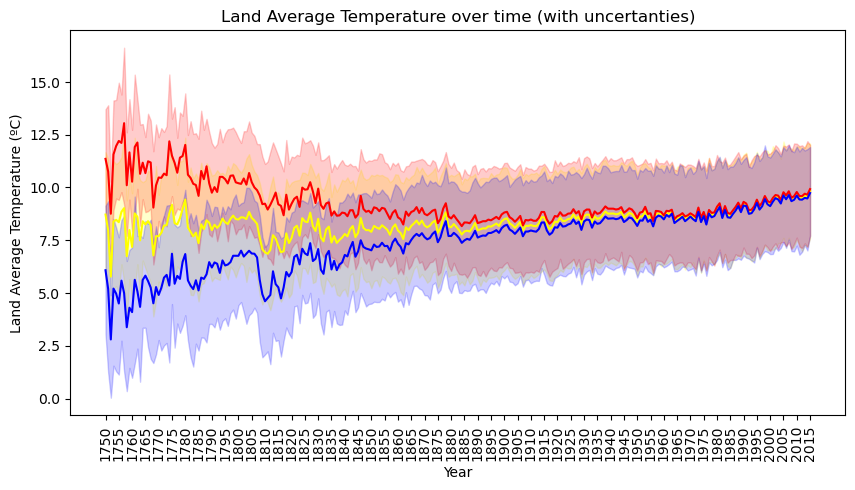

In [5]:
#Let's start by visulaizing the land average temperature over time
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(df_global, x='Year', y='LandAverageTemperature', color='yellow', ax=ax)
sns.lineplot(df_global, x='Year', y='LandAverageTemperature+Unc', color='red', ax=ax)
sns.lineplot(df_global, x='Year', y='LandAverageTemperature-Unc', color='blue', ax=ax)
plt.title('Land Average Temperature over time (with uncertanties)')
plt.ylabel('Land Average Temperature (ºC)')
plt.xlabel('Year')
ax.set_xticks(ax.get_xticks()[::5], labels=ax.get_xticklabels()[::5], 
              rotation=90,
              fontsize=10)
fig.savefig('Evolution_Land_AverageTemperature.png')
plt.show()

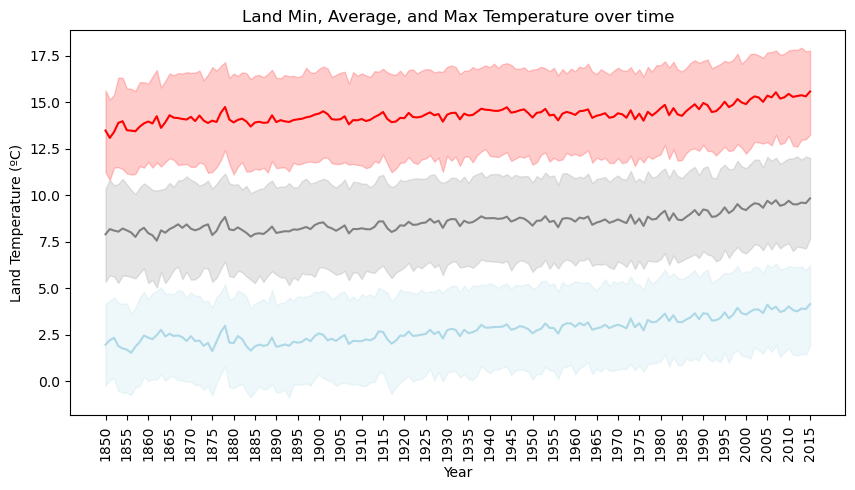

In [6]:
#Next, let's compare the land min, average, and max temperatures
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(df_global[df_global['Year']>='1850'], 
             x='Year', y='LandAverageTemperature', 
             color='grey', ax=ax)
sns.lineplot(df_global[df_global['Year']>='1850'], 
             x='Year', y='LandMaxTemperature', 
             color='red', ax=ax)
sns.lineplot(df_global[df_global['Year']>='1850'], 
             x='Year', y='LandMinTemperature', 
             color='lightblue', ax=ax)
plt.title('Land Min, Average, and Max Temperature over time')
plt.ylabel('Land Temperature (ºC)')
plt.xlabel('Year')
ax.set_xticks(ax.get_xticks()[::5], labels=ax.get_xticklabels()[::5], 
              rotation=90,
              fontsize=10)
fig.savefig('Evolution_Land_Temperature.png')
plt.show()

In [7]:
#Great! Now, let's move on to the countries data set.
#We'll follow a similar process to the global data set above.
#Let's start with some basic prep
df_country['Year'] = df_country['dt'].str[0:4]
df_country['Decade'] = df_country['dt'].str[0:3]+'0'
df_country['AverageTemperature+Unc'] = df_country['AverageTemperature']+df_country['AverageTemperatureUncertainty']
df_country['AverageTemperature-Unc'] = df_country['AverageTemperature']-df_country['AverageTemperatureUncertainty']
df_country['Country'] = df_country['Country'].str.replace(' (Europe)', '')

In [8]:
#let's see which countries are missing from the list that we are working with in our data set
#let's compare this with the geojson data that shows all of the countries of the world
path = '/home/leslie-jordan/Downloads/custom.geo.json'
gdf = gpd.read_file(path)

dict_countries = {
    'United States of America': 'United States',
    'The Bahamas': 'Bahamas',
    'Trinidad and Tobago': 'Trinidad And Tobago',
    'Saint Vincent and the Grenadines': 'Saint Vincent And The Grenadines', 
    'Antigua and Barbuda': 'Antigua And Barbuda', 
    'Saint Kitts and Nevis': 'Saint Kitts And Nevis',   
    'United Republic of Tanzania': 'Tanzania',  
    'Republic of the Congo': 'Congo', 
    'Democratic Republic of the Congo': 'Congo (Democratic Republic Of The)', 
    'Ivory Coast': "Côte D'Ivoire", 
    'eSwatini': 'Swaziland', 
    'Guinea-Bissau': 'Guinea Bissau', 
    'São Tomé and Principe': 'Sao Tome And Principe', 
    'Cabo Verde': 'Cape Verde', 
    'Czechia': 'Czech Republic', 
    'North Macedonia': 'Macedonia', 
    'Republic of Serbia': 'Serbia', 
    'Bosnia and Herzegovina': 'Bosnia And Herzegovina',
    'Turks and Caicos Islands': 'Turks And Caicas Islands', 
    'Saint Pierre and Miquelon': 'Saint Pierre And Miquelon', 
    'United States Virgin Islands': 'Virgin Islands', 
    'Saint Barthelemy': 'Saint Barthélemy', 
    'Falkland Islands': 'Falkland Islands (Islas Malvinas)', 
    'Palestine': 'Palestina',
    'East Timor': 'Timor Leste', 
    'Hong Kong S.A.R.': 'Hong Kong', 
    'Macao S.A.R': 'Macau', 
    'Isle of Man': 'Isle Of Man', 
    'Aland': 'Åland', 
    'Federated States of Micronesia': 'Federated States Of Micronesia'
}

gdf["admin_map"] = gdf["admin"].map(dict_countries )
gdf["admin"] = gdf.admin_map.combine_first(gdf.admin)

countries_gdf = gdf["admin"].unique()
countries_data = df_country['Country'].unique()

diff1 = [x for x in countries_gdf if x not in countries_data]
diff2 = [x for x in countries_data if x not in countries_gdf]

print(f"Countries in agg report but not in gdf: {diff2}")
print()
print(f"Countries in gdf but not in agg report: {diff1}")

Countries in agg report but not in gdf: ['Africa', 'Antarctica', 'Asia', 'Baker Island', 'Bonaire, Saint Eustatius And Saba', 'Burma', 'Christmas Island', 'Europe', 'French Guiana', 'French Southern And Antarctic Lands', 'Gaza Strip', 'Guadeloupe', 'Heard Island And Mcdonald Islands', 'Kingman Reef', 'Martinique', 'Mauritius', 'Mayotte', 'North America', 'Oceania', 'Palmyra Atoll', 'Reunion', 'Seychelles', 'South America', 'South Georgia And The South Sandwich Isla', 'Svalbard And Jan Mayen']

Countries in gdf but not in agg report: ['Bermuda', 'Brunei', 'Myanmar', 'Northern Cyprus', 'Siachen Glacier', 'Indian Ocean Territories', 'South Sudan', 'Somaliland', 'Kosovo', 'Vatican', 'Pitcairn Islands', 'Marshall Islands', 'Norfolk Island', 'Cook Islands', 'Wallis and Futuna', 'Tuvalu', 'Nauru', 'Vanuatu', 'Ashmore and Cartier Islands']


In [9]:
#Great! now, let's use the data to show an increase in temperature by each country
# Old timeframe: [first year to consider, last year to consider]
old = [1970, 1974]
# New timeframe: [first year to consider, last year to consider]
# Bear in mind data only goes until 2013, and 2013 is incomplete
new = [2008, 2012]
if (old[0] < 1743):
    print('Please choose years after 1743')
if (new[1] > 2013):
    print('Please choose years until 2013')
if (len(old) != 2) or (len(new) != 2):
    print('Please choose two years in each timeframe')
if (old[1] < old[0]) or (new[1] < new[0]):
    print('Always define the lower year first')
cond_old = (df_country['Year'] >= str(old[0])) & (df_country['Year'] <= str(old[1]))
df_country.loc[cond_old, 'Period'] = 'Old'
cond_new = (df_country['Year'] >= str(new[0])) & (df_country['Year'] <= str(new[1]))
df_country.loc[cond_new, 'Period'] = 'New'
diff_temp = df_country.pivot_table(index='Country', columns='Period', 
                                   values='AverageTemperature', aggfunc='mean')
diff_temp['Diff'] = diff_temp['New']-diff_temp['Old']
diff_temp = diff_temp.reset_index()
map_diff = gdf.merge(diff_temp, how='inner', left_on='admin', right_on='Country')
map_diff = map_diff.set_geometry("geometry")

In [10]:
#now, let's make a visual tool to show the increase in temperature in each country
m = folium.Map(location=[30, 0], zoom_start=1)

#for x in np.arange(len(map_countries)):
folium.Choropleth(
        geo_data=map_diff.loc[:,'geometry'],
        data=map_diff['Diff'],
        key_on="feature.id",
        fill_color='OrRd',
        #bins=[-40, -20, 0, 20, 40]
    ).add_to(m)

folium.map.Marker(
    [-40, -40],
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(0,0),
        html='<div style="font-size: 10pt">Increase in temperature by country</div>',
        )
    ).add_to(m)

folium.map.Marker(
    [-50, -20],
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(0,0),
        html='<div style="font-size: 10pt">'+str(new[0])+'-'+str(new[1])+' vs '+str(old[0])+'-'+str(old[1])+'</div>',
        )
    ).add_to(m)

m.save('Increase_temperature_countries.html')

# Visualizar
m

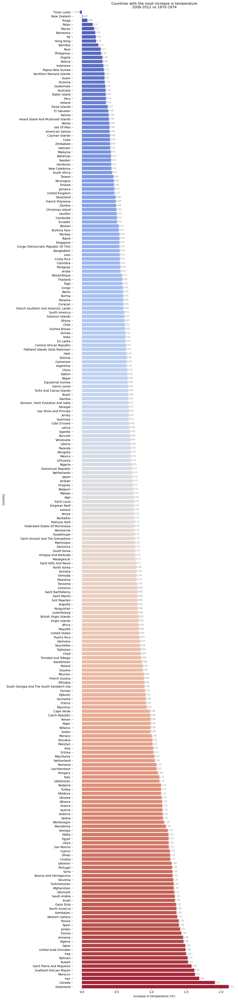

In [11]:
#Let's show the countries with the most increase in temperature between 2008-2012 as compared with temps from 1970-1974
#Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(10, 60))

#Plot the increases
sns.set_color_codes("pastel")
sns.barplot(x="Diff", y="Country", 
            data=diff_temp.sort_values('Diff', ascending=True),
            label="Increase in temperature (ºC)", palette="coolwarm")

#Add a title and informative axis label
plt.title('Countries with the most increase in temperature\n'+str(new[0])+'-'+str(new[1])+' vs '+str(old[0])+'-'+str(old[1]))
ax.set(xlabel="Increase in temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='grey')
sns.despine(left=True, bottom=True)

f.savefig('Countries_highest_increase_temp.png')

In [12]:
#looks like Greenland has had the biggest increase in temperature by quite a bit
#let's look at Greenland more closely just to ensure this wasn't a mistake
country = 'Greenland'
countries = df_country['Country'].drop_duplicates()
if country in countries.to_list():
    print('Okay, go ahead!')
    df_country_sel = df_country[df_country['Country']==country]
else:
    poss = countries.apply(lambda x: SequenceMatcher(None, x, country).ratio())\
         .reset_index().rename(columns={'Country':'Ratio'})\
         .set_index(countries).sort_values('Ratio', ascending=False)\
         .index[0:5].values
    print('Country not found! Maybe you meant one of these?')
    print(poss)
    country=poss[0]
    df_country_sel = df_country[df_country['Country']==poss[0]]
    print('If the country you meant is *{}*, you can go ahead!'.format(poss[0]))

Okay, go ahead!


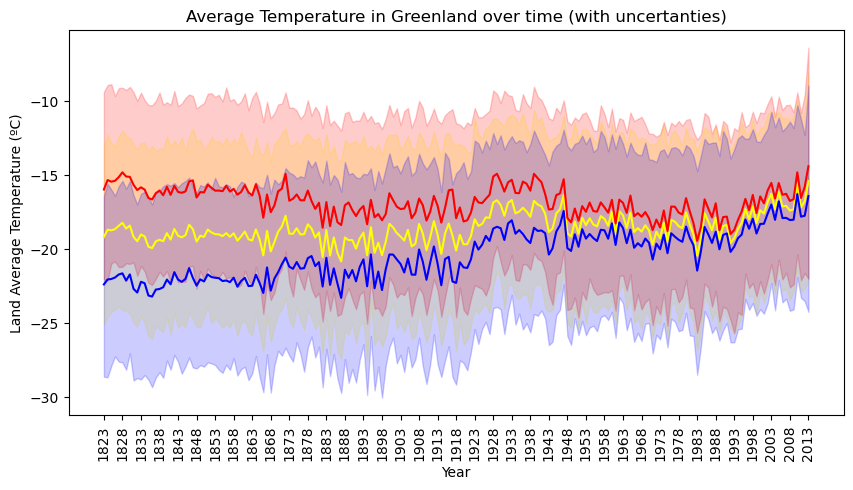

In [13]:
#looks like we're good to go!
#let's look further into greenland by visualizing it's average temperature increases over the years
fig, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(df_country_sel, x='Year', y='AverageTemperature', color='yellow', ax=ax)
sns.lineplot(df_country_sel, x='Year', y='AverageTemperature+Unc', color='red', ax=ax)
sns.lineplot(df_country_sel, x='Year', y='AverageTemperature-Unc', color='blue', ax=ax)
plt.title('Average Temperature in '+country+' over time (with uncertanties)')
plt.ylabel('Land Average Temperature (ºC)')
plt.xlabel('Year')
ax.set_xticks(ax.get_xticks()[::5], labels=ax.get_xticklabels()[::5], 
              rotation=90,
              fontsize=10)
fig.savefig('Evolution_Temperature_'+country+'.png')
plt.show()

In [4]:
#ok great! this helps us understand what's going on with greenlad a bit better.
#alright, now let's move on to cities
#let's start by cleaning up the data set, dropping null values, and prepping the data for geospatial analysis
df_city['Year'] = df_city['dt'].str[0:4]
df_city['Decade'] = df_city['dt'].str[0:3]+'0'
df_city['AverageTemperature+Unc'] = df_city['AverageTemperature']+df_city['AverageTemperatureUncertainty']
df_city['AverageTemperature-Unc'] = df_city['AverageTemperature']-df_city['AverageTemperatureUncertainty']
df_city['Country'] = df_city['Country'].str.replace(' (Europe)', '')
df_city['CityCountry'] = df_city['City']+', '+df_city['Country']
df_city.loc[df_city['Latitude'].str[-1:]=='N','Lat']=df_city['Latitude'].str[:-1].astype(float)
df_city.loc[df_city['Latitude'].str[-1:]=='S','Lat']=-df_city['Latitude'].str[:-1].astype(float)
df_city['AbsLat'] = abs(df_city['Lat'])
df_city['Lat2'] = df_city['Lat']*df_city['Lat']
df_city.loc[df_city['Longitude'].str[-1:]=='E','Lon']=df_city['Longitude'].str[:-1].astype(float)
df_city.loc[df_city['Longitude'].str[-1:]=='W','Lon']=-df_city['Longitude'].str[:-1].astype(float)
df_city = df_city.dropna()

In [5]:
year = 2012

df_city_year = df_city[df_city['Year']==str(year)]

df_city_year = df_city_year.groupby(['City', 'Country', 'CityCountry']).agg({
                    'Lat': 'mean',
                    'Lon': 'mean',
                    'AverageTemperature': 'mean'
                }).reset_index()

df_city_year['AbsLat'] = abs(df_city_year['Lat'])
df_city_year['Lat2'] = df_city_year['Lat']*df_city_year['Lat']

In [6]:
def color_producer(x):

    mint = df_city_year['AverageTemperature'].min()
    maxt = df_city_year['AverageTemperature'].max()
    interval = (maxt - mint)/6
    
    if x < mint+interval:
        return 'darkblue'
    elif x < mint+2*interval:
        return 'blue'
    elif x < mint+3*interval:
        return 'cadetblue'
    elif x < mint+4*interval:
        return 'orange'
    elif x < mint+5*interval:
        return 'red'
    else:
        return 'darkred'

In [7]:
m = folium.Map(location=[30, 0], zoom_start=1)

for idx, row in df_city_year.iterrows():
    label=str(row['City'])+' ('+row['Country']+'): '+'{:.2f}'.format(row['AverageTemperature'])+'ºC'
    Circle(
            location=[row['Lat'], row['Lon']],
            radius=20,
            color=color_producer(row['AverageTemperature']),
            popup=label
        ).add_to(m)
    
folium.map.Marker(
    [-40,-40],
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(0,0),
        html='<div style="font-size: 10pt">Average temperature by city ('+str(year)+')</div>',
        )
    ).add_to(m)    
 
m.save('Average_temperature_cities.html')    
    
m

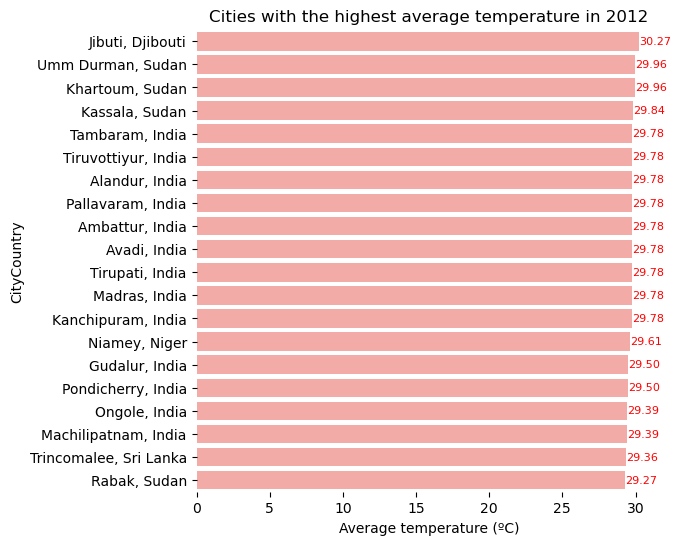

In [8]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=df_city_year.sort_values('AverageTemperature', ascending=False)[0:20],
             x='AverageTemperature',
             y='CityCountry',
             color='r')

# Add a title and informative axis label
plt.title('Cities with the highest average temperature in '+str(year))
ax.set(xlabel="Average temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='red')
sns.despine(left=True, bottom=True)

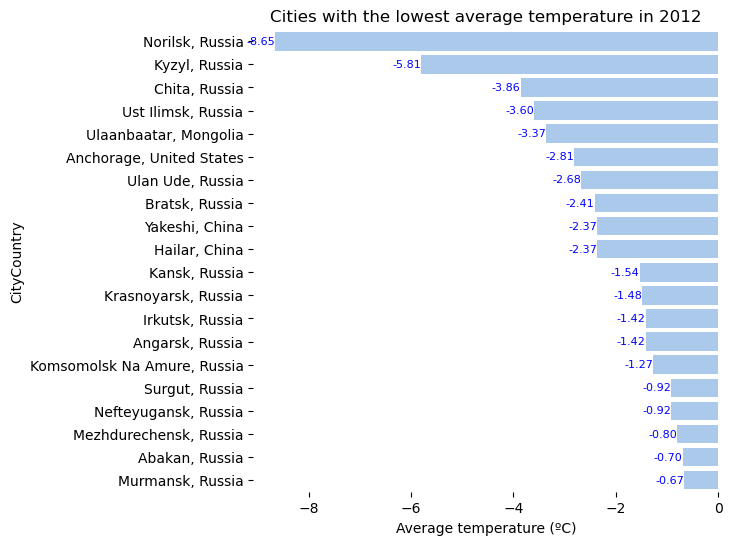

In [9]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=df_city_year.sort_values('AverageTemperature', ascending=True)[0:20],
             x='AverageTemperature',
             y='CityCountry',
             color='b')

# Add a title and informative axis label
plt.title('Cities with the lowest average temperature in '+str(year))
ax.set(xlabel="Average temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='blue')
sns.despine(left=True, bottom=True)

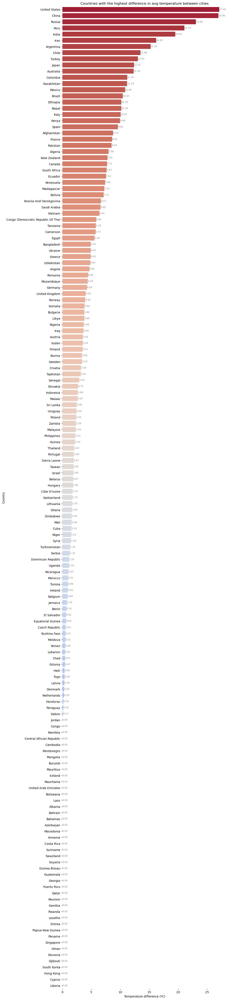

In [10]:
df_city_year_ct = df_city_year.groupby('Country')['AverageTemperature'].agg(['min', 'max']).reset_index()
df_city_year_ct['Diff'] = df_city_year_ct['max']-df_city_year_ct['min']

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(10, 60))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=df_city_year_ct.sort_values('Diff', ascending=False),
             x='Diff',
             y='Country',
             palette='coolwarm_r')

# Add a title and informative axis label
plt.title('Countries with the highest difference in avg temperature between cities')
ax.set(xlabel="Temperature difference (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='grey')
sns.despine(left=True, bottom=True)

f.savefig('Countries_most_temp_difference.png')

Text(0.5, 1.0, 'Longitude vs AverageTemperature')

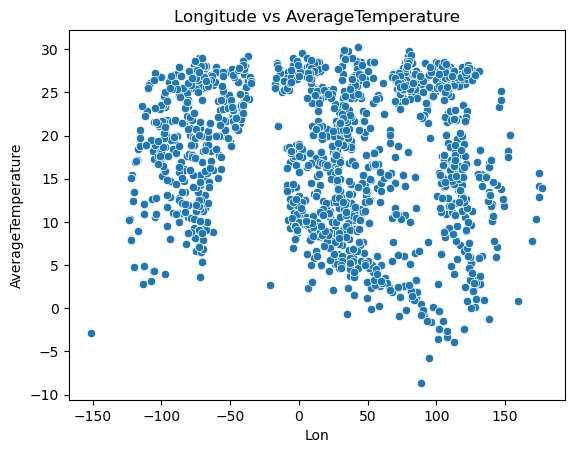

In [11]:
sns.scatterplot(x=df_city_year['Lon'], 
                y=df_city_year['AverageTemperature'])

plt.title('Longitude vs AverageTemperature')

Text(0.5, 1.0, 'Latitude vs AverageTemperature')

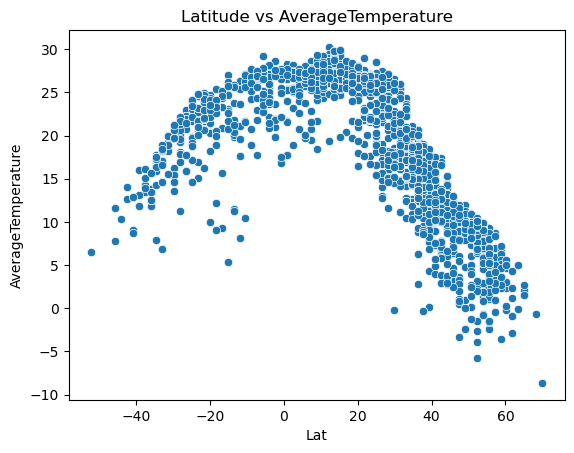

In [12]:
sns.scatterplot(x=df_city_year['Lat'], 
                y=df_city_year['AverageTemperature'])

plt.title('Latitude vs AverageTemperature')

Text(0.5, 1.0, 'Absolute Latitude (distance from Ecuator) vs AverageTemperature')

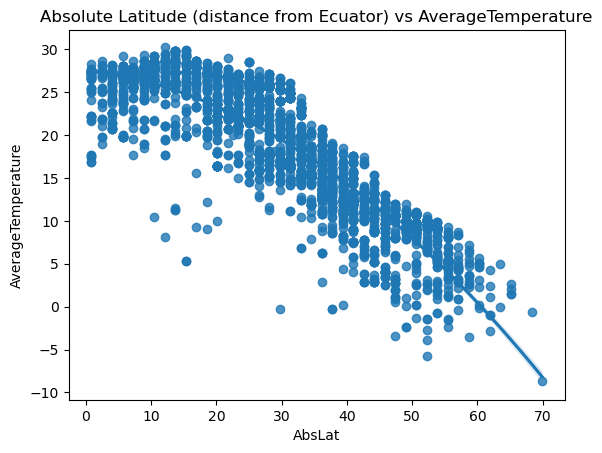

In [13]:
sns.regplot(x=df_city_year['AbsLat'], 
            y=df_city_year['AverageTemperature'],
            order=2)

plt.title('Absolute Latitude (distance from Ecuator) vs AverageTemperature')

In [14]:
model = LinearRegression()

model.fit(df_city_year[['AbsLat', 'Lat2']], df_city_year['AverageTemperature'])
pred = model.predict(df_city_year.set_index('CityCountry')[['AbsLat', 'Lat2']])

residuals = df_city_year.set_index('CityCountry')['AverageTemperature'] - pred
residuals = residuals.reset_index()

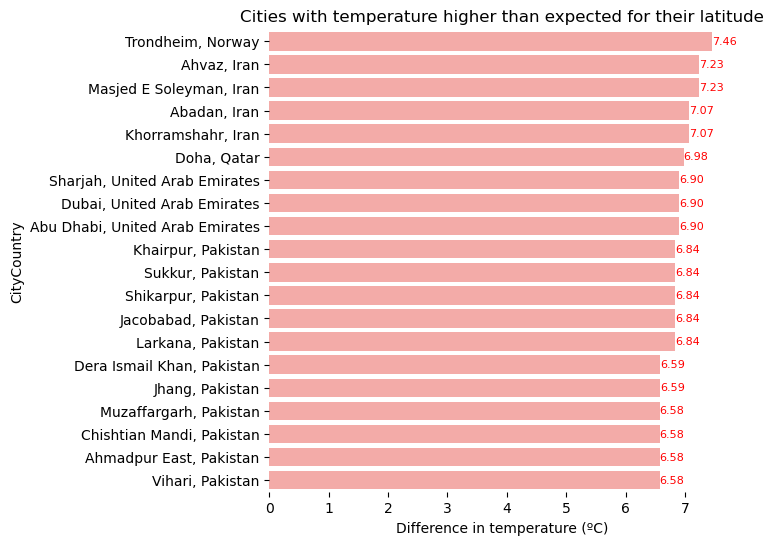

In [15]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=residuals.sort_values('AverageTemperature', ascending=False)[0:20],
             x='AverageTemperature',
             y='CityCountry',
             color='r')

# Add a title and informative axis label
plt.title('Cities with temperature higher than expected for their latitude')
ax.set(xlabel="Difference in temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='red')
sns.despine(left=True, bottom=True)

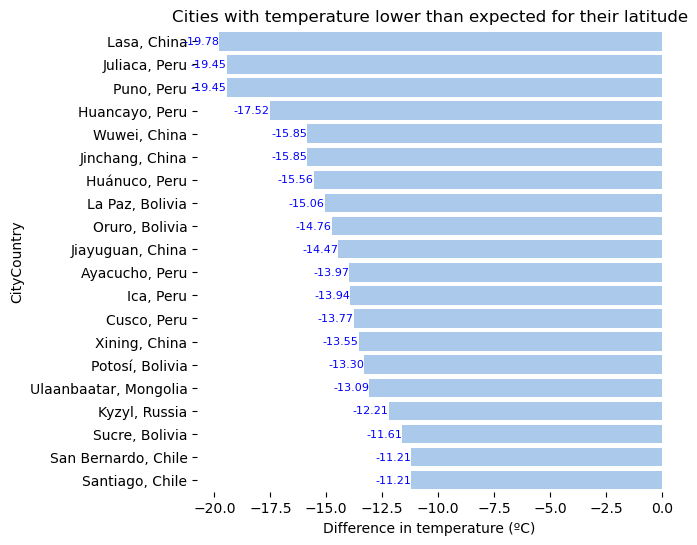

In [16]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=residuals.sort_values('AverageTemperature', ascending=True)[0:20],
             x='AverageTemperature',
             y='CityCountry',
             color='b')

# Add a title and informative axis label
plt.title('Cities with temperature lower than expected for their latitude')
ax.set(xlabel="Difference in temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='blue')
sns.despine(left=True, bottom=True)

In [17]:
#Great! Let's explore the evolution of temperatures over time.

# Old timeframe: [first year to consider, last year to consider]
old = [1970, 1974]

# New timeframe: [first year to consider, last year to consider]
# Bear in mind data only goes until 2013, and 2013 is incomplete
new = [2008, 2012]

if (old[0] < 1743):
    print('Please choose years after 1743')
if (new[1] > 2013):
    print('Please choose years until 2013')
if (len(old) != 2) or (len(new) != 2):
    print('Please choose two years in each timeframe')
if (old[1] < old[0]) or (new[1] < new[0]):
    print('Always define the lower year first')

cond_old = (df_city['Year'] >= str(old[0])) & (df_city['Year'] <= str(old[1]))
df_city.loc[cond_old, 'Period'] = 'Old'

cond_new = (df_city['Year'] >= str(new[0])) & (df_city['Year'] <= str(new[1]))
df_city.loc[cond_new, 'Period'] = 'New'

diff_temp = df_city.pivot_table(index=['CityCountry', 'Lat', 'Lon'], 
                                columns='Period', 
                                values='AverageTemperature', aggfunc='mean')

diff_temp['Diff'] = diff_temp['New']-diff_temp['Old']

diff_temp = diff_temp.reset_index()

In [18]:
def color_producer(x):

    percentiles = np.percentile(diff_temp['Diff'], [0, 20, 40, 60, 80, 100])
    
    if x < percentiles[1]:
        return 'blue'
    elif x < percentiles[2]:
        return 'orange'
    elif x < percentiles[3]:
        return 'red'
    elif x < percentiles[4]:
        return 'darkred'
    else:
        return 'black'

In [19]:


m = folium.Map(location=[30, 0], zoom_start=1)

for idx, row in diff_temp.iterrows():
    label=str(row['CityCountry'])+': '+'{:.2f}'.format(row['Diff'])+'ºC'
    Circle(
            location=[row['Lat'], row['Lon']],
            radius=20,
            color=color_producer(row['Diff']),
            popup=label
        ).add_to(m)
    
folium.map.Marker(
    [-40,-40],
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(0,0),
        html='<div style="font-size: 10pt">Increase in temperature by city</div>',
        )
    ).add_to(m)    

folium.map.Marker(
    [-50,-27],
    icon=DivIcon(
        icon_size=(250,36),
        icon_anchor=(0,0),
        html='<div style="font-size: 10pt">'+str(new[0])+'-'+str(new[1])+' vs '+str(old[0])+'-'+str(old[1])+'</div>',
        )
    ).add_to(m)     
        
m.save('Increase_temperature_cities.html')
    
m

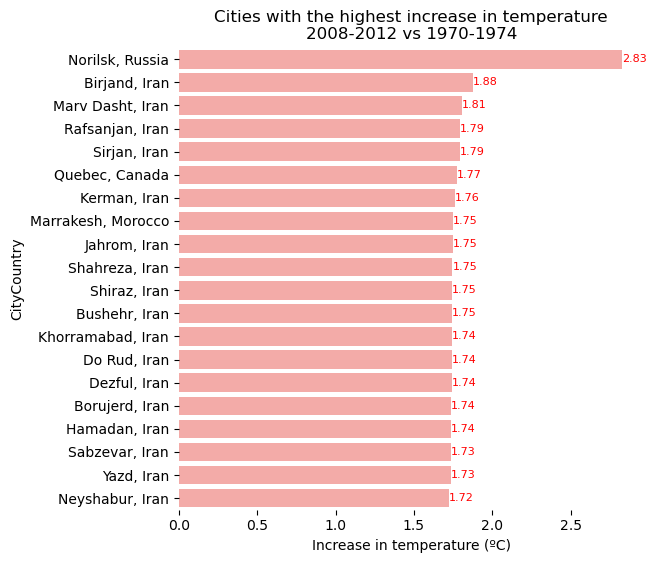

In [20]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=diff_temp.sort_values('Diff', ascending=False)[0:20],
             x='Diff',
             y='CityCountry',
             color='r')

# Add a title and informative axis label
plt.title('Cities with the highest increase in temperature\n'+str(new[0])+'-'+str(new[1])+' vs '+str(old[0])+'-'+str(old[1]))
ax.set(xlabel="Increase in temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='red')
sns.despine(left=True, bottom=True)

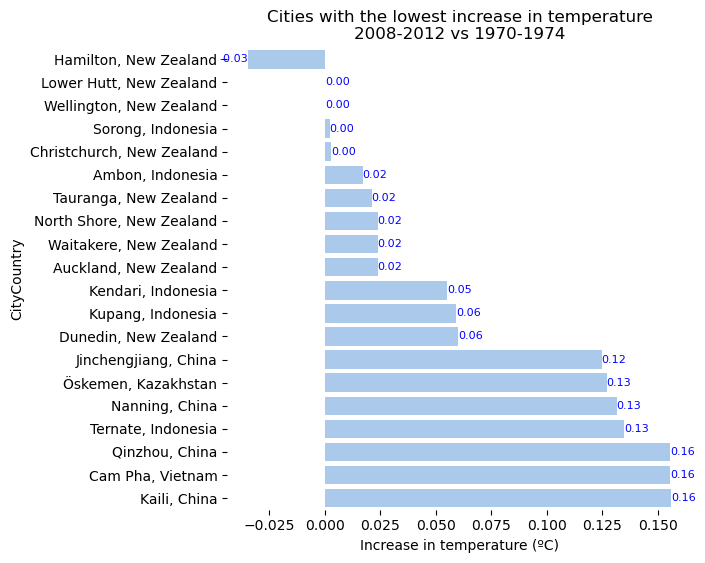

In [21]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 6))

# Plot the increases
sns.set_color_codes("pastel")
sns.barplot(data=diff_temp.sort_values('Diff', ascending=True)[0:20],
             x='Diff',
             y='CityCountry',
             color='b')

# Add a title and informative axis label
plt.title('Cities with the lowest increase in temperature\n'+str(new[0])+'-'+str(new[1])+' vs '+str(old[0])+'-'+str(old[1]))
ax.set(xlabel="Increase in temperature (ºC)")
ax.bar_label(ax.containers[0], fmt='%.2f', fontsize=8, color='blue')
sns.despine(left=True, bottom=True)

Text(0.5, 1.0, 'Longitude vs Increase in Temperature')

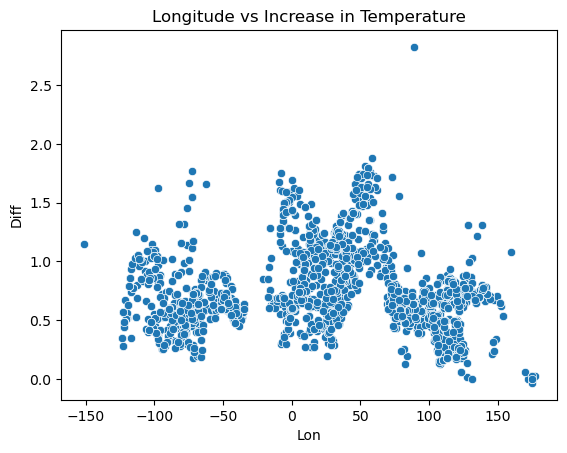

In [22]:
sns.scatterplot(x=diff_temp['Lon'], 
                y=diff_temp['Diff'])

plt.title('Longitude vs Increase in Temperature')

In [23]:
city = 'London, United Kingdom'

cities = df_city['CityCountry'].drop_duplicates()

if city in cities.to_list():
    print('Okay, go ahead!')
    df_city_sel = df_city[df_city['CityCountry']==city]
else:
    poss = cities.apply(lambda x: SequenceMatcher(None, x, city).ratio())\
         .reset_index().rename(columns={'CityCountry':'Ratio'})\
         .set_index(cities).sort_values('Ratio', ascending=False)\
         .index[0:5].values
    print('City not found! Maybe you meant one of these?')
    print(poss)
    city=poss[0]
    df_city_sel = df_city[df_city['CityCountry']==city]
    print('If the city you meant is *{}*, you can go ahead!'.format(poss[0]))

Okay, go ahead!


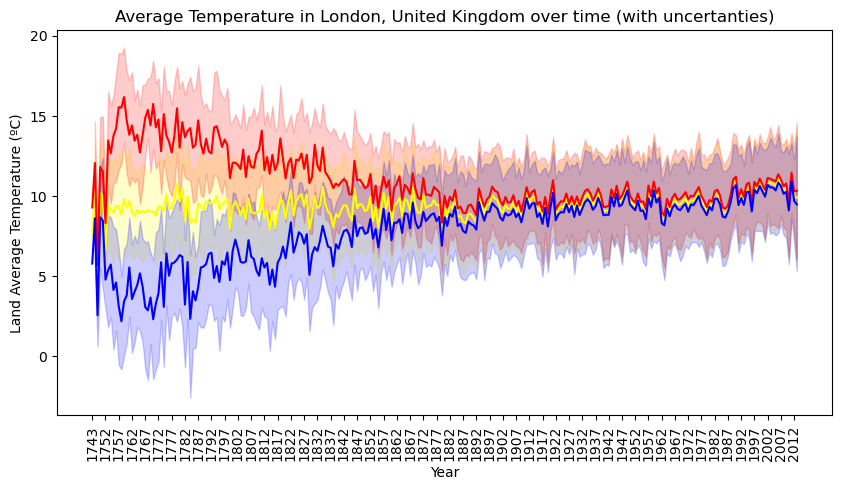

In [24]:
fig, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(df_city_sel, x='Year', y='AverageTemperature', color='yellow', ax=ax)
sns.lineplot(df_city_sel, x='Year', y='AverageTemperature+Unc', color='red', ax=ax)
sns.lineplot(df_city_sel, x='Year', y='AverageTemperature-Unc', color='blue', ax=ax)

plt.title('Average Temperature in '+city+' over time (with uncertanties)')
plt.ylabel('Land Average Temperature (ºC)')
plt.xlabel('Year')

ax.set_xticks(ax.get_xticks()[::5], labels=ax.get_xticklabels()[::5], 
              rotation=90,
              fontsize=10)

fig.savefig('Evolution_Temperature_'+city+'.png')

plt.show()

In [ ]:
#Here are the summarized findings:

#Global temperatures have been rising consistently, especially since the 1970s. 
#Virtually all countries and cities have experienced this increase, with a more pronounced rise in the northern hemisphere, likely due to higher industrialization. 
#While there's no correlation between a city's average temperature and its longitude, there is a strong correlation with latitude. 
#Some cities have temperatures lower than expected for their latitude (mostly in mountainous regions), while others are higher than expected (mostly in deserts). 
#Feedback and suggestions for improving the analysis are welcome.